In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams["figure.figsize"] = [15, 10]


import sys
sys.path.append('../../')

In [2]:
from keras.preprocessing import image
import numpy as np
from sklearn.model_selection import train_test_split

from src.classifier import TLClassifier
from src.utilities import load_dataset_from_path, UIUC_EVENT_CLASS, CODALAB_GENDER_CLASS, CODALAB_SMILE_CLASS, KAGGLE_DOGCAT_CLASS
from src.plots import plot_confusion_matrix

Using TensorFlow backend.


# UIUC Sports

In [4]:
# Codalab Gender 3 classes
# VGG16 bottleneck path
vgg16_model = TLClassifier('vgg16', 8, 'uiuc/224_224/model/vgg16/checkpoint/improved-094-0.97.hdf5')
inception_model = TLClassifier('inceptionv3', 8, 'uiuc/224_224/model/inceptionv3/checkpoint/improved-042-0.97.hdf5')
resnet50_model = TLClassifier('resnet50', 8, 'uiuc/224_224/model/resnet50/checkpoint/improved-016-0.98.hdf5')

../../src/utilities.py:325: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("se...)`
  output=top_model(base_model.output))


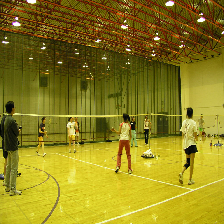

In [5]:
# Example image
uiuc_1_path = '../data/uiuc/Easy_Mid_badminton_163.jpg'
uiuc_1_img = image.load_img(uiuc_1_path, target_size=(224, 224))
uiuc_1 = image.img_to_array(uiuc_1_img)
uiuc_1 = np.expand_dims(uiuc_1, axis=0)
uiuc_1_img

In [6]:
from sklearn.metrics.classification import accuracy_score, confusion_matrix

print(vgg16_model.predict(uiuc_1))
print(inception_model.predict(uiuc_1))
print(resnet50_model.predict(uiuc_1))

[[ 1.  0.  0.  0.  0.  0.  0.  0.]]
[[  1.00000000e+00   8.21623450e-14   5.04974606e-17   6.77293935e-19
    5.26837536e-19   1.90875086e-17   1.98962128e-19   5.29973998e-19]]
[[  9.99994874e-01   5.97017618e-07   3.65496021e-07   1.77634377e-07
    6.16674299e-07   9.16362808e-09   2.12397633e-09   3.37263350e-06]]


## Predicting with 3 models

In [7]:
data_path = 'uiuc/224_224/training_data.npz'
label_path = 'uiuc/224_224/training_label.npz'
training_data = load_dataset_from_path(data_path)
training_label = load_dataset_from_path(label_path)
train_data, val_data, train_label, val_label = train_test_split(training_data, training_label, random_state=42, stratify=training_label)

metrics = [accuracy_score, confusion_matrix]

vgg16_preds = vgg16_model.predict(val_data)
vgg16_y = np.argmax(vgg16_preds, axis=1)
vgg16_scores = vgg16_model.evaluate_metrics(vgg16_y, val_label, metrics)

inception_preds = inception_model.predict(val_data)
inception_y = np.argmax(inception_preds, axis=1)
inception_scores = inception_model.evaluate_metrics(inception_y, val_label, metrics)

resnet50_preds = resnet50_model.predict(val_data)
resnet50_y = np.argmax(resnet50_preds, axis=1)
resnet50_scores = resnet50_model.evaluate_metrics(resnet50_y, val_label, metrics)

In [8]:
vgg16_scores,inception_scores,resnet50_scores

([0.97974683544303798, array([[50,  0,  0,  0,  0,  0,  0,  0],
         [ 1, 30,  1,  1,  1,  0,  0,  0],
         [ 0,  2, 57,  0,  0,  0,  0,  0],
         [ 0,  1,  0, 44,  0,  0,  0,  0],
         [ 0,  0,  0,  0, 63,  0,  0,  0],
         [ 0,  0,  0,  0,  0, 49,  0,  0],
         [ 0,  0,  0,  0,  0,  0, 48,  0],
         [ 0,  0,  0,  0,  0,  1,  0, 46]])],
 [0.98987341772151893, array([[50,  0,  0,  0,  0,  0,  0,  0],
         [ 0, 33,  1,  0,  0,  0,  0,  0],
         [ 1,  1, 57,  0,  0,  0,  0,  0],
         [ 0,  1,  0, 44,  0,  0,  0,  0],
         [ 0,  0,  0,  0, 63,  0,  0,  0],
         [ 0,  0,  0,  0,  0, 49,  0,  0],
         [ 0,  0,  0,  0,  0,  0, 48,  0],
         [ 0,  0,  0,  0,  0,  0,  0, 47]])],
 [0.95443037974683542, array([[50,  0,  0,  0,  0,  0,  0,  0],
         [ 0, 28,  3,  2,  0,  1,  0,  0],
         [ 0,  1, 57,  1,  0,  0,  0,  0],
         [ 0,  1,  0, 42,  0,  0,  0,  2],
         [ 0,  0,  0,  2, 58,  1,  2,  0],
         [ 0,  0,  0,  0,  0

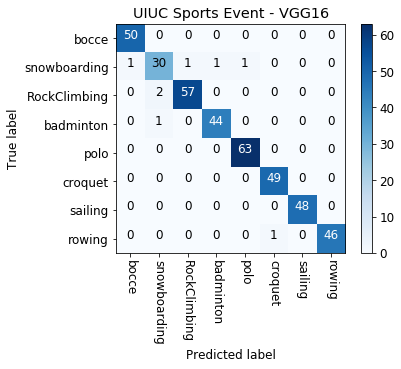

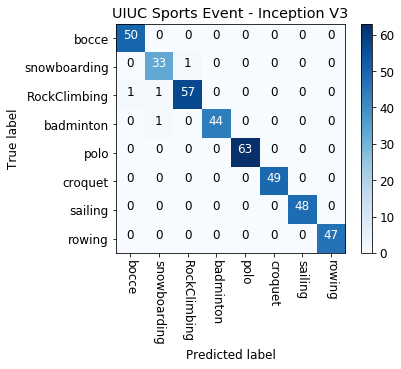

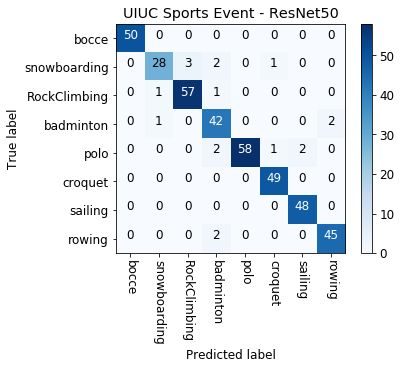

In [9]:
%matplotlib inline
plt.rcParams["figure.figsize"] = [6, 5]
plt.rcParams['font.size'] = 12
plot_confusion_matrix(plt, vgg16_scores[1], UIUC_EVENT_CLASS.keys(), title='UIUC Sports Event - VGG16', rotation=-90)
plot_confusion_matrix(plt, inception_scores[1], UIUC_EVENT_CLASS.keys(), title='UIUC Sports Event - Inception V3', rotation=-90)
plot_confusion_matrix(plt, resnet50_scores[1], UIUC_EVENT_CLASS.keys(), title='UIUC Sports Event - ResNet50', rotation=-90)

## Misclassified but has high confidence

In [10]:
from PIL import ImageFont
from PIL import ImageDraw

font = ImageFont.truetype("/usr/share/fonts/truetype/ubuntu-font-family/Ubuntu-B.ttf",17)
class_map = {v: k for k, v in UIUC_EVENT_CLASS.items()}

def wrong_class_high_probs(arc_y, arc_preds, val_label, n=10):
    # Get all the wrong classified images
    wrong_idx = np.where(arc_y != val_label)
    # Get the max probabilities (the max output of the 3 output neurons) of these wrong classified images
    wrong_idx_max_probs = np.max(arc_preds[wrong_idx], axis=1)
    # Sort based on those probabilities
    wrong_idx_probs_sorted = np.argsort(wrong_idx_max_probs)[::-1][:n]
    # Get the actual index of the images on wrong_idx
    sorted_wrong_idx = wrong_idx[0][wrong_idx_probs_sorted]
    return (sorted_wrong_idx, val_label[sorted_wrong_idx], arc_preds[sorted_wrong_idx], wrong_idx_max_probs[wrong_idx_probs_sorted.tolist()])

def draw_stats(img_array, true_label, pred_label, pred_prob):
    im = image.array_to_img(img_array)
    draw = ImageDraw.Draw(im)
    draw.text((0, 0),'True: %s \nPred: %s \nProb: %s' % (class_map[int(true_label)], class_map[pred_label], pred_prob),(0,255,0),font=font)
    draw = ImageDraw.Draw(im)
    return im

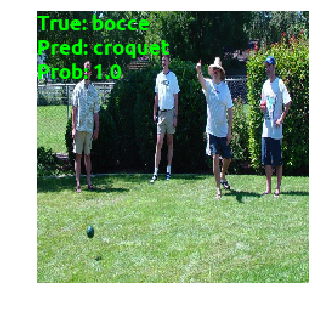

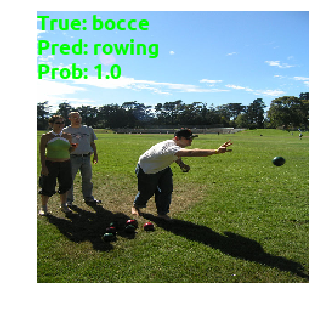

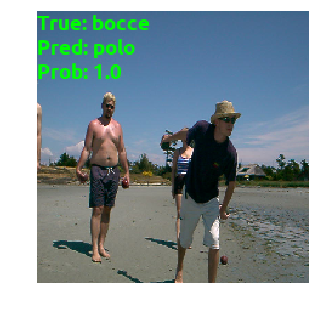

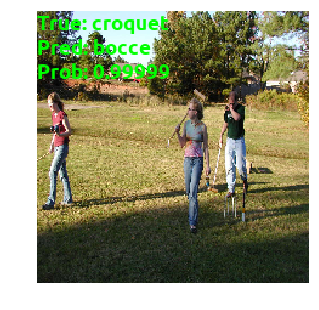

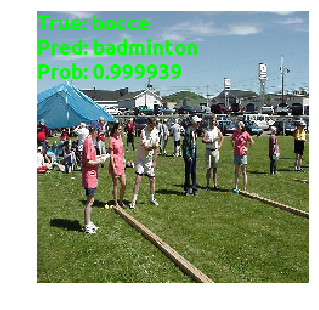

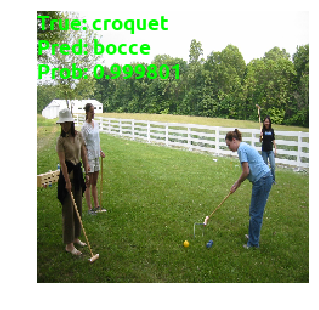

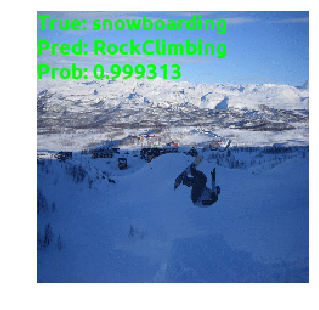

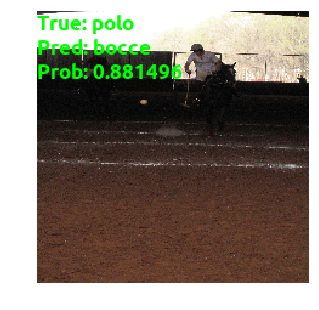

In [11]:
# Get all 10 images from VGG16
vgg16_sorted_wrong_idx, vgg16_true_labels, vgg16_pred_labels, vgg16_pred_probs = wrong_class_high_probs(vgg16_y, vgg16_preds, val_label, n=20) 
# Draw the images
for idx, wrong_idx in enumerate(vgg16_sorted_wrong_idx.tolist()):
    plt.figure()
    plt.axis('off')
    plt.imshow(draw_stats(val_data[wrong_idx], val_label[wrong_idx], vgg16_y[wrong_idx], vgg16_pred_probs[idx]))

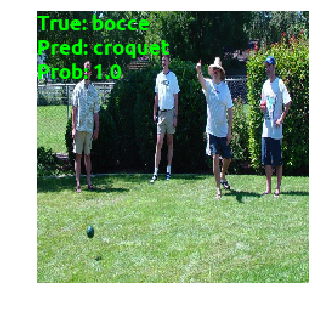

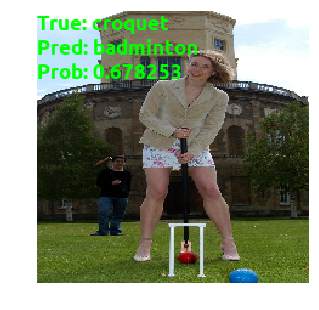

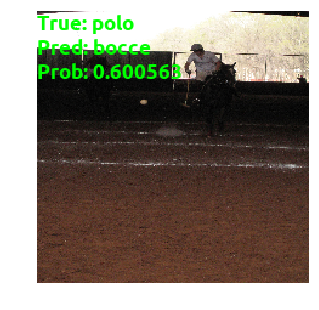

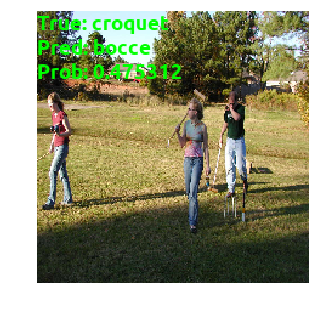

In [12]:
# Inceptionv3
inception_sorted_wrong_idx, inception_true_labels, inception_pred_labels, inception_pred_probs = wrong_class_high_probs(inception_y, inception_preds, val_label, n=20) 
# Draw the images
for idx, wrong_idx in enumerate(inception_sorted_wrong_idx.tolist()):
    plt.figure()
    plt.axis('off')
    plt.imshow(draw_stats(val_data[wrong_idx], val_label[wrong_idx], inception_y[wrong_idx], inception_pred_probs[idx]))


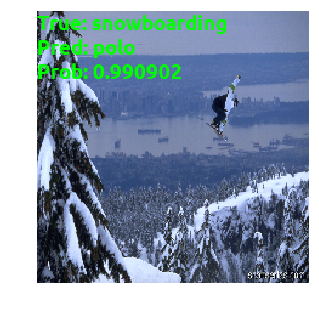

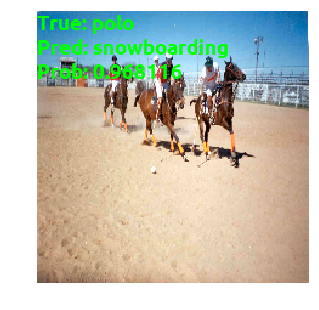

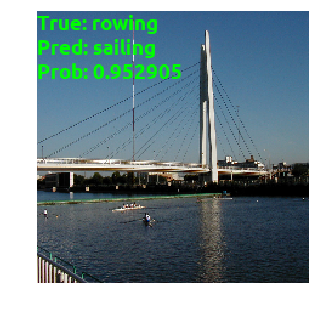

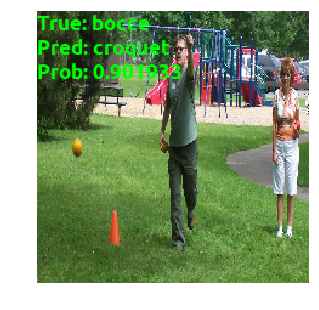

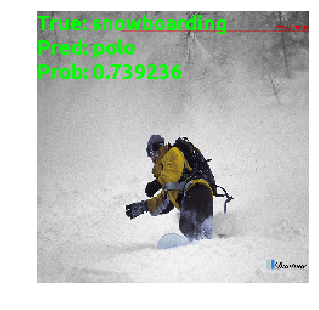

...

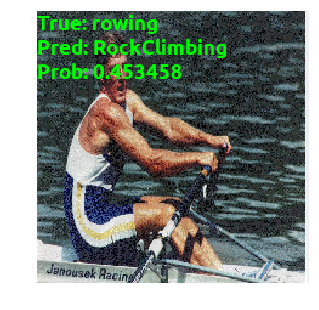

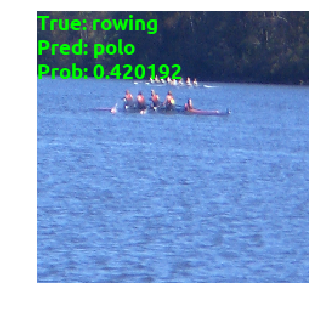

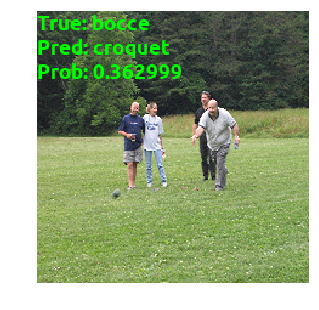

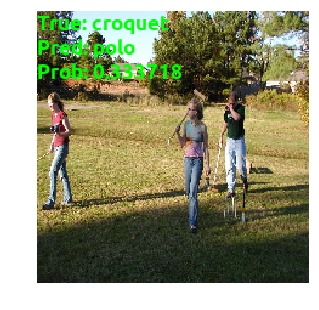

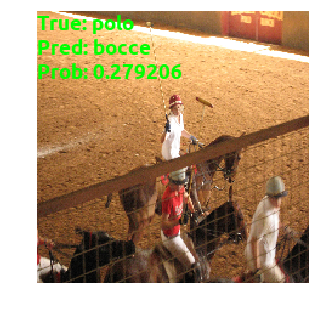

In [13]:
# resnet50
resnet50_sorted_wrong_idx, resnet50_true_labels, resnet50_pred_labels, resnet50_pred_probs = wrong_class_high_probs(resnet50_y, resnet50_preds, val_label, n=20) 
# Draw the images
for idx, wrong_idx in enumerate(resnet50_sorted_wrong_idx.tolist()):
    plt.figure()
    plt.axis('off')
    plt.imshow(draw_stats(val_data[wrong_idx], val_label[wrong_idx], resnet50_y[wrong_idx], resnet50_pred_probs[idx]))


## Classified true but has low confidence

In [14]:
def right_class_low_probs(arc_y, arc_preds, val_label, n=10):
    # Get all the right classified images
    right_idx = np.where(arc_y == val_label)
    # Get the max probabilities (the max output of the 3 output neurons) of these right classified images
    right_idx_max_probs = np.max(arc_preds[right_idx], axis=1)
    # Sort based on those probabilities - ascending, get the first n
    right_idx_probs_sorted = np.argsort(right_idx_max_probs)[:n]
    # Get the actual index of the images on right_idx
    sorted_right_idx = right_idx[0][right_idx_probs_sorted]
    return (sorted_right_idx, val_label[sorted_right_idx], arc_preds[sorted_right_idx], right_idx_max_probs[right_idx_probs_sorted.tolist()])


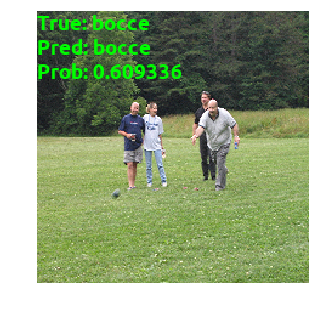

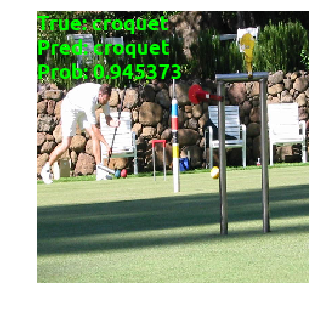

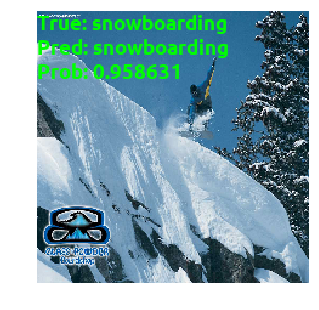

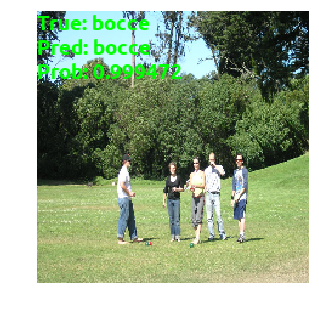

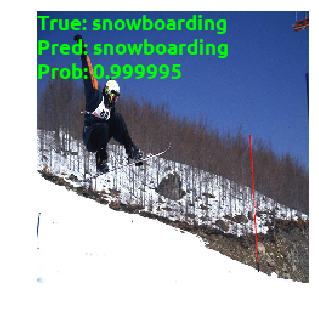

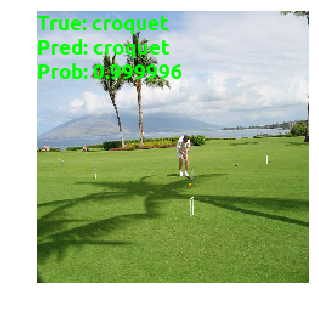

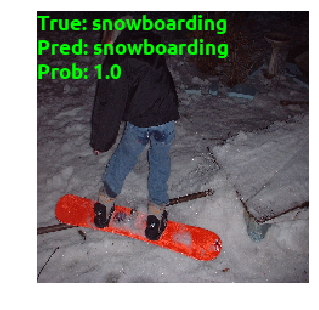

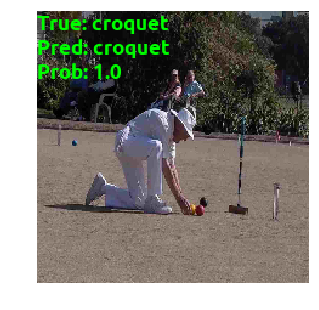

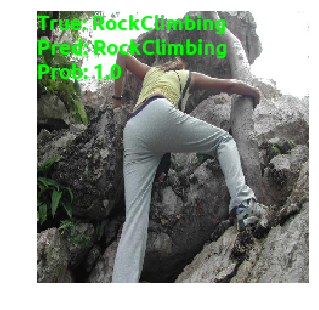

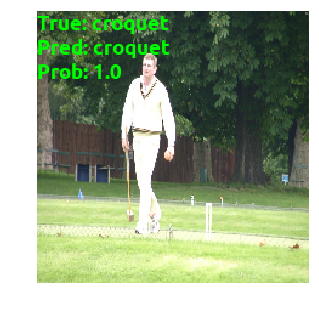

In [15]:
# Get all 10 images from VGG16
vgg16_right_sorted_idx, vgg16_right_true_labels, vgg16_right_pred_labels, vgg16_right_pred_probs = right_class_low_probs(vgg16_y, vgg16_preds, val_label, n=10) 
# Draw the images
for idx, right_idx in enumerate(vgg16_right_sorted_idx.tolist()):
    plt.figure()
    plt.axis('off')
    plt.imshow(draw_stats(val_data[right_idx], val_label[right_idx], vgg16_y[right_idx], vgg16_right_pred_probs[idx]))

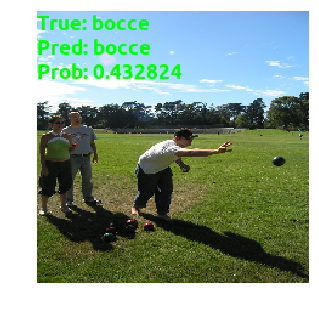

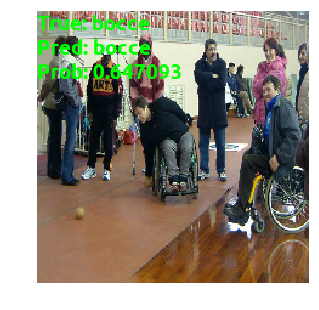

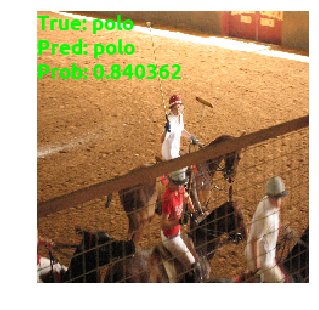

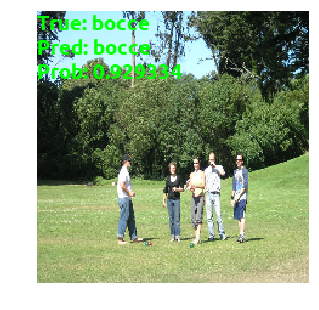

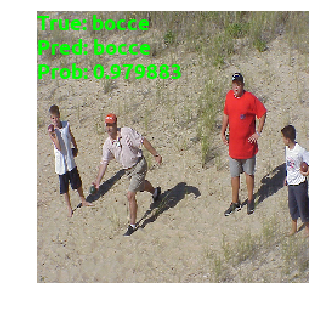

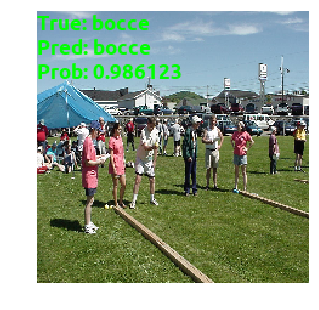

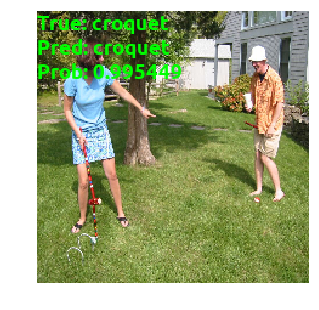

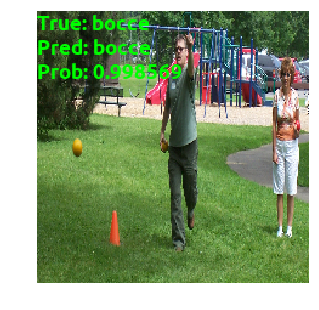

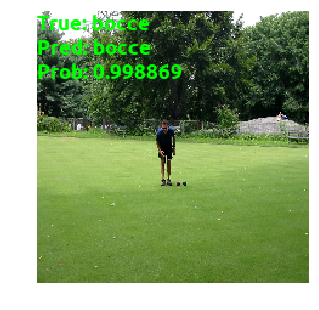

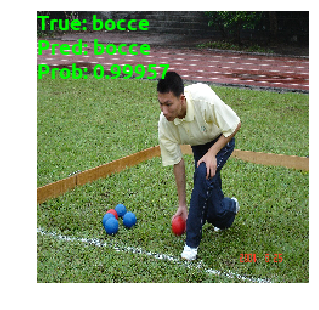

In [16]:
# Inception
inception_right_sorted_idx, inception_right_true_labels, inception_right_pred_labels, inception_right_pred_probs = right_class_low_probs(inception_y, inception_preds, val_label, n=10) 
# Draw the images
for idx, right_idx in enumerate(inception_right_sorted_idx.tolist()):
    plt.figure()
    plt.axis('off')
    plt.imshow(draw_stats(val_data[right_idx], val_label[right_idx], inception_y[right_idx], inception_right_pred_probs[idx]))

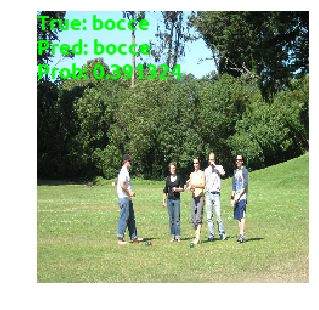

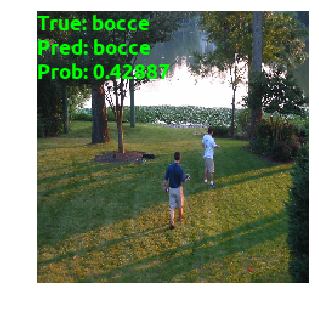

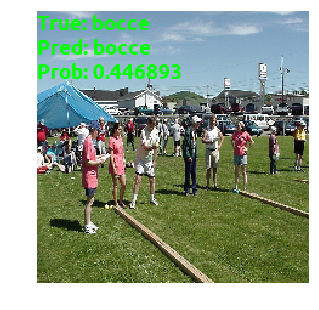

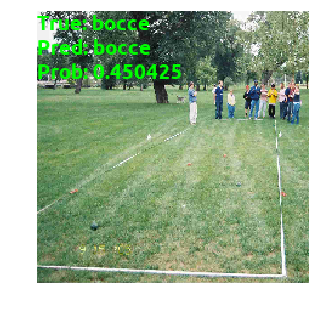

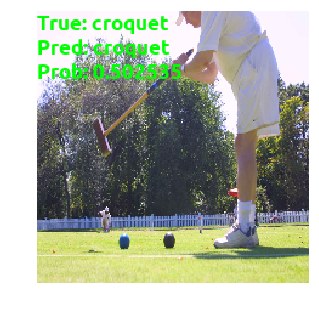

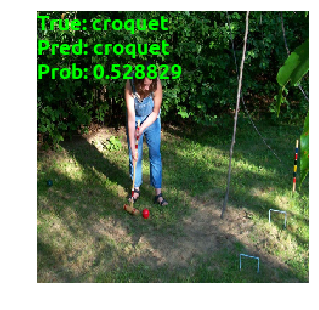

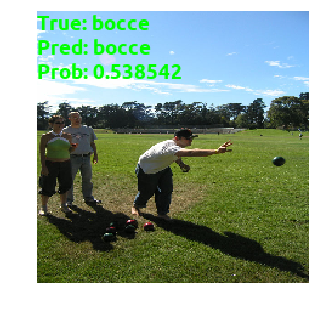

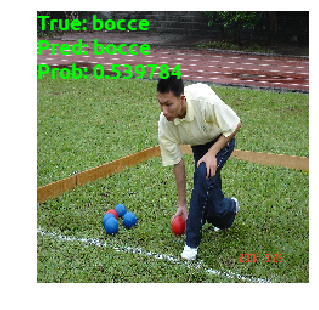

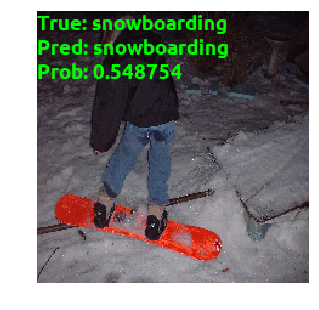

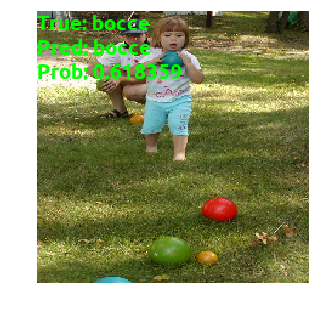

In [17]:
# Resnet50
resnet50_right_sorted_idx, resnet50_right_true_labels, resnet50_right_pred_labels, resnet50_right_pred_probs = right_class_low_probs(resnet50_y, resnet50_preds, val_label, n=10) 
# Draw the images
for idx, right_idx in enumerate(resnet50_right_sorted_idx.tolist()):
    plt.figure()
    plt.axis('off')
    plt.imshow(draw_stats(val_data[right_idx], val_label[right_idx], resnet50_y[right_idx], resnet50_right_pred_probs[idx]))